In [791]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import pandas as pd
import numpy as np
import seaborn as sns
import datetime as dt
import matplotlib.pyplot as plt
%config InlineBackend.figure_formats = ['retina']
sns.set()
import patsy
import scipy.stats as stats
import datetime as dt
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import LinearRegression, LassoCV, RidgeCV, Lasso, Ridge,ElasticNet
from sklearn.model_selection import train_test_split, cross_val_score, KFold,GridSearchCV
from sklearn.metrics import mean_absolute_error
import matplotlib.pyplot as plt
%matplotlib inline
import scipy.stats as stats
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

# Modeling

In [622]:
# READING CLEANED DATA SET FROM CSV FILE
df_original = pd.read_csv('CleanData.csv')

### Simple Data Cleaning

After merging all data frames that resulted in scrapping and performing the EDA on it. The data frame needs a little more clean-up.

In [623]:
# DISPLAYING ALL COLUMNS
df_original.columns 

Index(['Unnamed: 0', 'Driver', 'Race_result_Car', 'Race_result_Laps',
       'Race_result_PTS', 'Fastest_laps_Pos', 'Fastest_laps_Lap',
       'Fastest_laps_Time', 'Fastest_laps_Avg_Speed', 'Pit_stop_summary_Stops',
       'Pit_stop_summary_Total', 'Starting_grid_Pos', 'Starting_grid_Time',
       'Qualifying_Pos', 'Qualifying_Q1', 'Qualifying_Q2', 'Qualifying_Q3',
       'Qualifying_Laps', 'Practice_3_Pos', 'Practice_3_Time',
       'Practice_3_Laps', 'Practice_2_Pos', 'Practice_2_Time',
       'Practice_2_Laps', 'Practice_1_Pos', 'Practice_1_Time',
       'Practice_1_Laps', 'location', 'year'],
      dtype='object')

In [624]:
# DELETE AN ODD COLUMN THAT APPEARED BY MISTAKE
df_original=df_original.drop('Unnamed: 0',axis=1)

In [625]:
df_original.columns

Index(['Driver', 'Race_result_Car', 'Race_result_Laps', 'Race_result_PTS',
       'Fastest_laps_Pos', 'Fastest_laps_Lap', 'Fastest_laps_Time',
       'Fastest_laps_Avg_Speed', 'Pit_stop_summary_Stops',
       'Pit_stop_summary_Total', 'Starting_grid_Pos', 'Starting_grid_Time',
       'Qualifying_Pos', 'Qualifying_Q1', 'Qualifying_Q2', 'Qualifying_Q3',
       'Qualifying_Laps', 'Practice_3_Pos', 'Practice_3_Time',
       'Practice_3_Laps', 'Practice_2_Pos', 'Practice_2_Time',
       'Practice_2_Laps', 'Practice_1_Pos', 'Practice_1_Time',
       'Practice_1_Laps', 'location', 'year'],
      dtype='object')

Exploring what the cleaned data looks like. Displaying head, tail and a sample.

In [626]:
df_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3662 entries, 0 to 3661
Data columns (total 28 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Driver                  3662 non-null   object 
 1   Race_result_Car         3662 non-null   object 
 2   Race_result_Laps        3662 non-null   float64
 3   Race_result_PTS         3662 non-null   float64
 4   Fastest_laps_Pos        3662 non-null   float64
 5   Fastest_laps_Lap        3662 non-null   float64
 6   Fastest_laps_Time       3662 non-null   float64
 7   Fastest_laps_Avg_Speed  3662 non-null   float64
 8   Pit_stop_summary_Stops  3662 non-null   float64
 9   Pit_stop_summary_Total  3662 non-null   float64
 10  Starting_grid_Pos       3662 non-null   float64
 11  Starting_grid_Time      3662 non-null   float64
 12  Qualifying_Pos          3662 non-null   int64  
 13  Qualifying_Q1           3662 non-null   float64
 14  Qualifying_Q2           3662 non-null   

In [627]:
df_original.head()

,Driver,Race_result_Car,Race_result_Laps,Race_result_PTS,Fastest_laps_Pos,Fastest_laps_Lap,Fastest_laps_Time,Fastest_laps_Avg_Speed,Pit_stop_summary_Stops,Pit_stop_summary_Total,...,Practice_3_Time,Practice_3_Laps,Practice_2_Pos,Practice_2_Time,Practice_2_Laps,Practice_1_Pos,Practice_1_Time,Practice_1_Laps,location,year
0,Lewis Hamilton HAM,Mercedes,56.0,25.0,4.0,44.0,94.015,207.235,2.0,48.915,...,91.316,14.0,3.0,91.082,24.0,4.0,91.921,15.0,Bahrain,2021
1,Max Verstappen VER,Red Bull Racing Honda,56.0,18.0,2.0,41.0,93.228,208.984,2.0,48.615,...,90.577,11.0,1.0,90.847,23.0,1.0,91.394,12.0,Bahrain,2021
2,Valtteri Bottas BOT,Mercedes,56.0,16.0,1.0,56.0,92.090,211.566,3.0,81.725,...,91.855,16.0,5.0,91.218,23.0,2.0,91.692,17.0,Bahrain,2021
3,Lando Norris NOR,McLaren Mercedes,56.0,12.0,6.0,38.0,94.396,206.398,2.0,50.539,...,92.860,10.0,2.0,90.942,25.0,3.0,91.897,20.0,Bahrain,2021
4,Sergio Perez PER,Red Bull Racing Honda,56.0,10.0,3.0,44.0,93.970,207.334,3.0,72.289,...,91.908,11.0,10.0,91.503,23.0,6.0,92.071,15.0,Bahrain,2021


In [628]:
df_original.tail()

,Driver,Race_result_Car,Race_result_Laps,Race_result_PTS,Fastest_laps_Pos,Fastest_laps_Lap,Fastest_laps_Time,Fastest_laps_Avg_Speed,Pit_stop_summary_Stops,Pit_stop_summary_Total,...,Practice_3_Time,Practice_3_Laps,Practice_2_Pos,Practice_2_Time,Practice_2_Laps,Practice_1_Pos,Practice_1_Time,Practice_1_Laps,location,year
3657,Lucas di Grassi DIG,Virgin Cosworth,53.0,0.0,19.0,50.0,106.126,188.402,1.0,21.705,...,105.629,22.0,22.0,106.053,29.0,21.0,109.375,13.0,Abu Dhabi,2010
3658,Bruno Senna SEN,HRT Cosworth,53.0,0.0,20.0,52.0,106.255,188.173,1.0,23.749,...,105.490,16.0,24.0,107.434,28.0,22.0,109.590,18.0,Abu Dhabi,2010
3659,Christian Klien KLI,HRT Cosworth,53.0,0.0,21.0,44.0,106.646,187.483,1.0,31.988,...,106.464,17.0,23.0,107.210,32.0,23.0,110.274,17.0,Abu Dhabi,2010
3660,Jarno Trulli TRU,Lotus Cosworth,51.0,0.0,18.0,42.0,105.979,188.663,1.0,37.147,...,105.048,23.0,21.0,105.612,35.0,20.0,108.472,17.0,Abu Dhabi,2010
3661,Timo Glock GLO,Virgin Cosworth,43.0,0.0,22.0,39.0,106.837,187.148,1.0,20.930,...,105.050,20.0,20.0,105.259,31.0,19.0,108.450,19.0,Abu Dhabi,2010


In [629]:
df_original.sample(3)

,Driver,Race_result_Car,Race_result_Laps,Race_result_PTS,Fastest_laps_Pos,Fastest_laps_Lap,Fastest_laps_Time,Fastest_laps_Avg_Speed,Pit_stop_summary_Stops,Pit_stop_summary_Total,...,Practice_3_Time,Practice_3_Laps,Practice_2_Pos,Practice_2_Time,Practice_2_Laps,Practice_1_Pos,Practice_1_Time,Practice_1_Laps,location,year
3611,Bruno Senna SEN,HRT Cosworth,53.0,0.0,20.0,30.0,119.290,169.452,2.0,52.201,...,103.417,19.0,24.0,106.649,3.0,23.0,110.821,15.0,South Korea,2010
2677,Timo Glock GLO,Marussia Cosworth,55.0,0.0,21.0,41.0,102.748,190.987,2.0,42.842,...,99.796,18.0,21.0,99.651,15.0,18.0,102.330,14.0,China,2012
2143,Esteban Gutierrez GUT,Sauber Ferrari,32.0,0.0,18.0,29.0,90.485,174.300,1.0,24.050,...,86.023,23.0,18.0,87.480,32.0,11.0,87.967,25.0,Hungary,2014


## Establishing Correlation

In [630]:
# SPLITTING NUMERICAL FEATURES FROM CATEGORICAL FEATURES
df_numerical=df_original[['Race_result_PTS','Race_result_Laps','Fastest_laps_Pos','Fastest_laps_Lap',
                      'Fastest_laps_Avg_Speed','Pit_stop_summary_Stops','Starting_grid_Pos', 'Qualifying_Pos',
                      'Qualifying_Laps','Practice_3_Pos','Practice_3_Laps','Practice_2_Pos','Practice_2_Laps',
                      'Practice_1_Pos', 'Practice_1_Laps','year']].copy()

In [631]:
# DETERMINING THE CORRELATIN BETWEEN ALL FEATURES
df_numerical.corr()

,Race_result_PTS,Race_result_Laps,Fastest_laps_Pos,Fastest_laps_Lap,Fastest_laps_Avg_Speed,Pit_stop_summary_Stops,Starting_grid_Pos,Qualifying_Pos,Qualifying_Laps,Practice_3_Pos,Practice_3_Laps,Practice_2_Pos,Practice_2_Laps,Practice_1_Pos,Practice_1_Laps,year
Race_result_PTS,1.000000,0.190913,-0.653020,0.163634,0.106047,-0.061702,-0.685841,-0.690741,0.321618,-0.631830,-0.070168,-0.616612,0.011010,-0.585491,0.044852,0.043623
Race_result_Laps,0.190913,1.000000,-0.291006,0.721679,-0.182694,0.089897,-0.095710,-0.096883,0.217183,-0.084902,0.256809,-0.081810,0.214537,-0.089968,0.322117,0.095755
Fastest_laps_Pos,-0.653020,-0.291006,1.000000,-0.306438,-0.175742,-0.082291,0.658686,0.677105,-0.388292,0.649412,0.067666,0.640373,-0.049120,0.626637,-0.056280,-0.099473
Fastest_laps_Lap,0.163634,0.721679,-0.306438,1.000000,-0.007673,0.047487,-0.078711,-0.082073,0.206043,-0.072356,0.196414,-0.062746,0.169121,-0.068737,0.197539,0.016643
Fastest_laps_Avg_Speed,0.106047,-0.182694,-0.175742,-0.007673,1.000000,-0.080754,-0.127117,-0.130999,0.007477,-0.134761,-0.182431,-0.132359,-0.014303,-0.124495,-0.084198,0.236288
Pit_stop_summary_Stops,-0.061702,0.089897,-0.082291,0.047487,-0.080754,1.000000,0.033682,0.033998,-0.152039,0.050271,-0.049956,0.031906,-0.045021,0.034344,-0.082358,-0.131792
Starting_grid_Pos,-0.685841,-0.095710,0.658686,-0.078711,-0.127117,0.033682,1.000000,0.980762,-0.625609,0.815734,0.089258,0.778740,-0.056547,0.727646,-0.056523,-0.107878
Qualifying_Pos,-0.690741,-0.096883,0.677105,-0.082073,-0.130999,0.033998,0.980762,1.000000,-0.640129,0.827991,0.091510,0.798925,-0.059053,0.751214,-0.058165,-0.105184
Qualifying_Laps,0.321618,0.217183,-0.388292,0.206043,0.007477,-0.152039,-0.625609,-0.640129,1.000000,-0.492663,0.087990,-0.466041,0.117534,-0.439690,0.186351,-0.013216
Practice_3_Pos,-0.631830,-0.084902,0.649412,-0.072356,-0.134761,0.050271,0.815734,0.827991,-0.492663,1.000000,0.068227,0.778225,-0.053973,0.724373,-0.058469,-0.097759


Text(0.5, 1.0, 'Correlation Between Features')

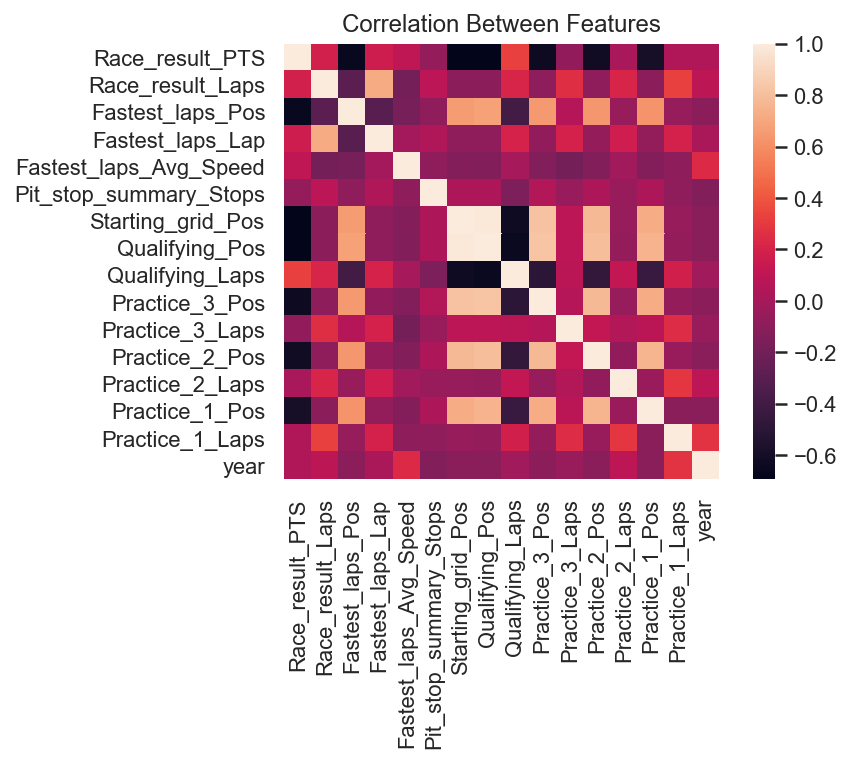

In [906]:
sns.heatmap(df_numerical.corr(), annot=False, square=True)
plt.title("Correlation Between Features")

<ipython-input-905-f8155d1df099>:5: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corr_matrix, dtype=np.bool)


Text(0.5, 1.0, 'Correlation Plot For Variables')

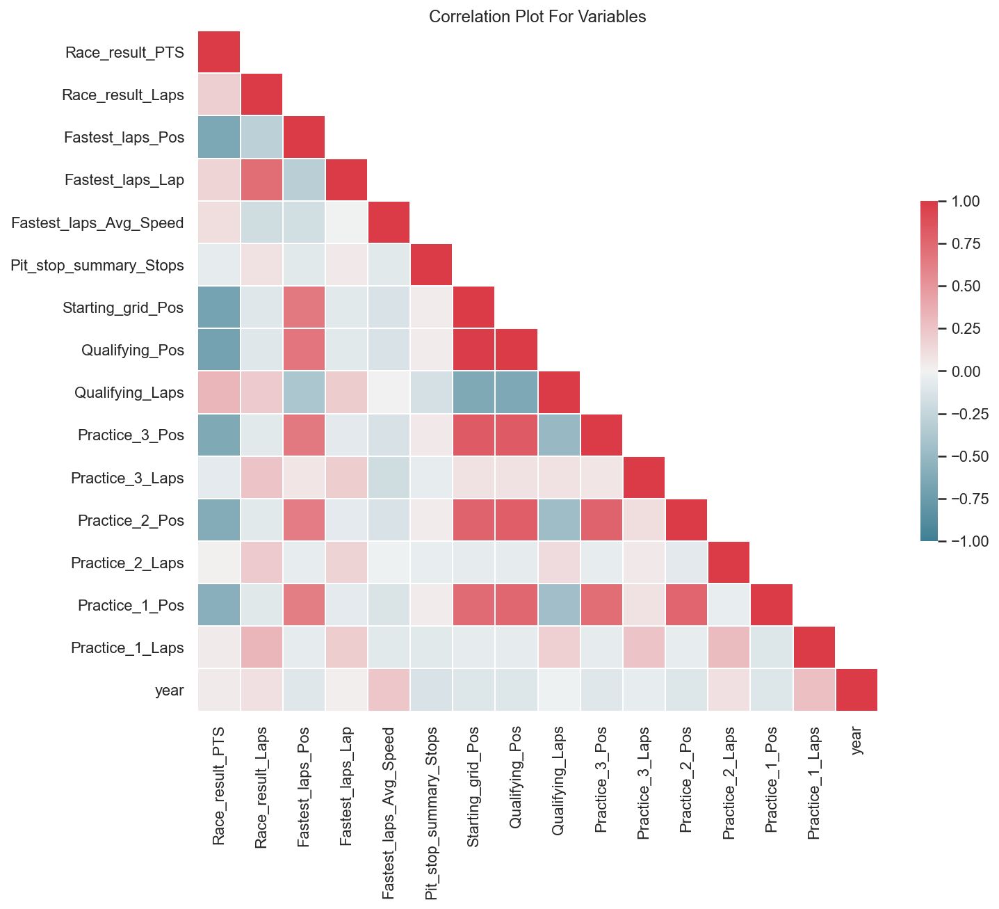

In [905]:
sns.set(style="white")
corr_matrix = df_numerical.corr()

mask = np.zeros_like(corr_matrix, dtype=np.bool)
mask[np.triu_indices_from(mask, k=1)] = True

f, ax = plt.subplots(figsize=(11, 9))

cmap = sns.diverging_palette(220, 10, as_cmap=True)

sns_heat = sns.heatmap(corr_matrix, mask=mask, cmap=cmap, vmin=-1,vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
figure = sns_heat.get_figure()
plt.title("Correlation Plot For Variables")

Text(0.5, 1.0, 'Relationship Between Features')

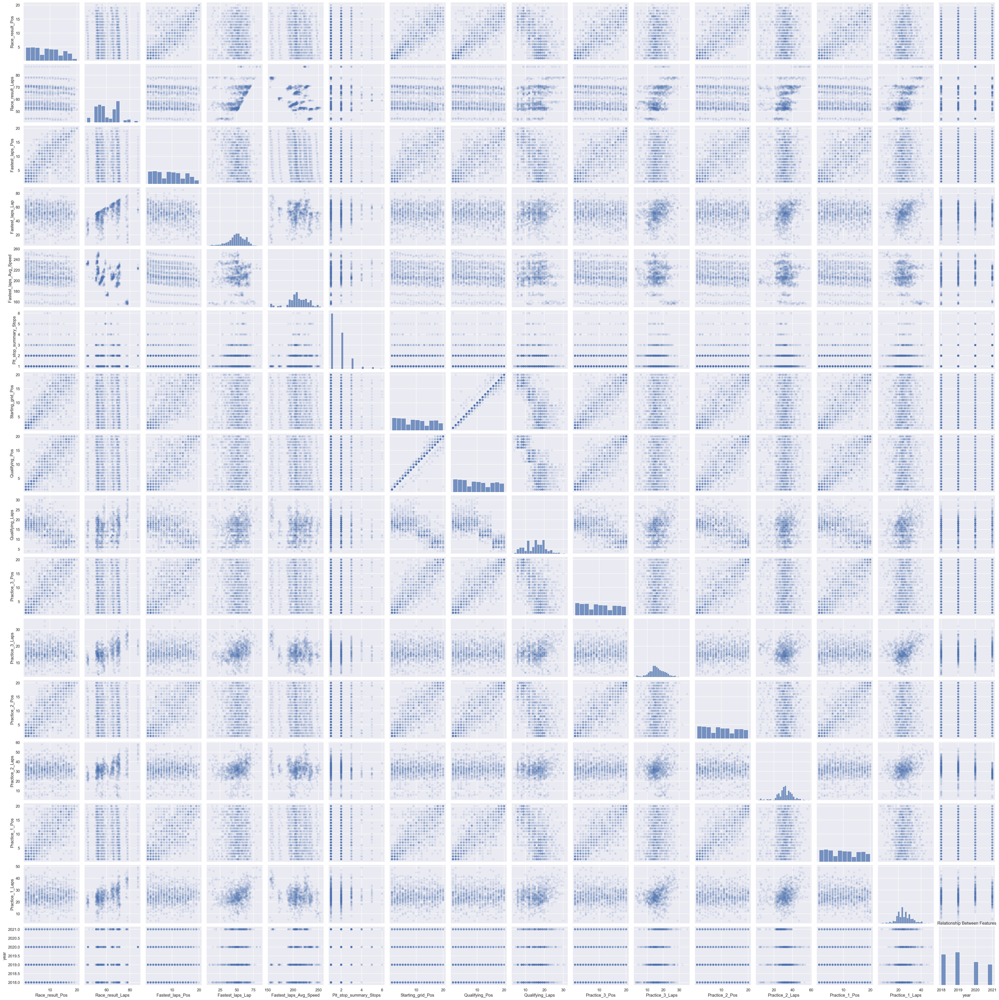

In [481]:
sns.pairplot(df_numerical[:1000], plot_kws=dict(alpha=.1, edgecolor='none'))
plt.title("Relationship Between Features")

# Building the Model

The data will be split (generically) in order to perform initial models.

In [637]:
# SPLITTING THE X AND THE Y (FEATURES AND TARGET)
Xoriginal = df_original[[ 'Race_result_Laps', 
       'Fastest_laps_Pos', 'Fastest_laps_Lap', 'Fastest_laps_Time',
       'Fastest_laps_Avg_Speed', 'Pit_stop_summary_Stops',
       'Pit_stop_summary_Total', 'Starting_grid_Pos', 'Starting_grid_Time',
       'Qualifying_Pos', 'Qualifying_Q1', 'Qualifying_Q2', 'Qualifying_Q3',
       'Qualifying_Laps', 'Practice_3_Pos', 'Practice_3_Time',
       'Practice_3_Laps', 'Practice_2_Pos', 'Practice_2_Time',
       'Practice_2_Laps', 'Practice_1_Pos', 'Practice_1_Time',
       'Practice_1_Laps', 'year']]
yoriginal = df_original['Race_result_PTS']

The data will be split even further into Train & Test and then into Train and Validate to test some models and to know the distribution of the error and the behaviour of the expected model.

In [638]:
# FIRST ROUND OF SPLITTING
X, X_test, y, y_test = train_test_split(Xoriginal, yoriginal, test_size=0.2, random_state=40)
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, random_state=40)

In [635]:
Xoriginal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3662 entries, 0 to 3661
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Race_result_Laps        3662 non-null   float64
 1   Fastest_laps_Pos        3662 non-null   float64
 2   Fastest_laps_Lap        3662 non-null   float64
 3   Fastest_laps_Time       3662 non-null   float64
 4   Fastest_laps_Avg_Speed  3662 non-null   float64
 5   Pit_stop_summary_Stops  3662 non-null   float64
 6   Pit_stop_summary_Total  3662 non-null   float64
 7   Starting_grid_Pos       3662 non-null   float64
 8   Starting_grid_Time      3662 non-null   float64
 9   Qualifying_Pos          3662 non-null   int64  
 10  Qualifying_Q1           3662 non-null   float64
 11  Qualifying_Q2           3662 non-null   float64
 12  Qualifying_Q3           3662 non-null   float64
 13  Qualifying_Laps         3662 non-null   float64
 14  Practice_3_Pos          3662 non-null   

### Simple OLS Model

Using the OLS model to get a feel of our model and know how it can be improved.

In [640]:
model = sm.OLS(y,X)
fit = model.fit()
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:        Race_result_PTS   R-squared (uncentered):                   0.723
Model:                            OLS   Adj. R-squared (uncentered):              0.721
Method:                 Least Squares   F-statistic:                              316.0
Date:                Sat, 23 Oct 2021   Prob (F-statistic):                        0.00
Time:                        20:14:20   Log-Likelihood:                         -8764.2
No. Observations:                2929   AIC:                                  1.758e+04
Df Residuals:                    2905   BIC:                                  1.772e+04
Df Model:                          24                                                  
Covariance Type:            nonrobust                                                  
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Race_result_Laps           0.0846      0.013      6.283      0.000       0.058       0.111
Fastest_laps_Pos          -0.3317      0.024    -13.757      0.000      -0.379      -0.284
Fastest_laps_Lap           0.0077      0.009      0.809      0.419      -0.011       0.026
Fastest_laps_Time          0.0303      0.028      1.069      0.285      -0.025       0.086
Fastest_laps_Avg_Speed    -0.0010      0.005     -0.196      0.844      -0.011       0.009
Pit_stop_summary_Stops    -0.9546      0.101     -9.433      0.000      -1.153      -0.756
Pit_stop_summary_Total     0.0004      0.000      1.626      0.104   -8.95e-05       0.001
Starting_grid_Pos         -0.2989      0.075     -3.975      0.000      -0.446      -0.151
Starting_grid_Time       -34.7219     75.534     -0.460      0.646    -182.828     113.385
Qualifying_Pos            -0.3569      0.082     -4.348      0.000      -0.518      -0.196
Qualifying_Q1              0.0617      0.039      1.600      0.110      -0.014       0.137
Qualifying_Q2              0.0805      0.061      1.315      0.189      -0.040       0.200
Qualifying_Q3             34.6604     75.534      0.459      0.646    -113.445     182.766
Qualifying_Laps           -0.3008      0.024    -12.291      0.000      -0.349      -0.253
Practice_3_Pos            -0.0531      0.028     -1.897      0.058      -0.108       0.002
Practice_3_Time           -0.0515      0.029     -1.796      0.073      -0.108       0.005
Practice_3_Laps            0.0197      0.023      0.859      0.391      -0.025       0.065
Practice_2_Pos            -0.0587      0.028     -2.130      0.033      -0.113      -0.005
Practice_2_Time           -0.0341      0.024     -1.397      0.163      -0.082       0.014
Practice_2_Laps           -0.0412      0.012     -3.539      0.000      -0.064      -0.018
Practice_1_Pos            -0.0254      0.025     -1.004      0.316      -0.075       0.024
Practice_1_Time            0.0087      0.028      0.314      0.754      -0.046       0.063
Practice_1_Laps            0.0245      0.017      1.469      0.142      -0.008       0.057
year                       0.0079      0.001      6.228      0.000       0.005       0.010
==============================================================================
Omnibus:                      245.690   Durbin-Watson:                   2.004
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              474.088
Skew:                           0.567   Prob(JB):                    1.13e-103
Kurtosis:                       4.612   Cond. No.                     2.44e+06
==============================================================================

Notes:
[1] R² is computed without centering (uncente

### Diagnostic Plots Function

In [383]:
def diagnostic_plots(y_pred, y_true, resid):
    fig, axes = plt.subplots(1, 3, figsize=(10, 4))

    g1 = sns.regplot(x=y_pred, y=y_true, ci=False, fit_reg=False, line_kws={'color': 'blue'}, ax=axes[0], scatter_kws={'s': 5})
    g1.set_xlabel('Predicted Target')
    g1.set_ylabel('True Target')
    g1.plot(y_true, y_true, '--', color='gray')

    g2 = sns.regplot(x=y_pred, y=resid, lowess=True, ax=axes[1], line_kws={'color': 'red'}, scatter_kws={'s': 5})
    g2.set_xlabel('Predicted Target')
    g2.set_ylabel('Residual')
    g2.axhline(y=0, color='gray', linestyle='--')

    stats.probplot(resid, dist="norm", plot=axes[2])

    fig.suptitle('Diagnostic Plots');
    fig.tight_layout();

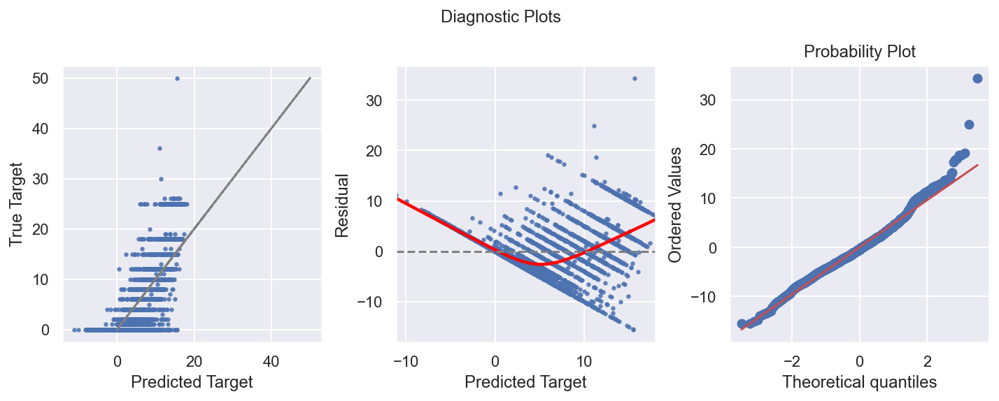

In [641]:
# FIRST CALL ON THE FUNCTION AFTER PERFORMING THE INTITIAL MODEL (OLS)
diagnostic_plots(fit.fittedvalues, y, fit.resid)

**First Plot - Predicted Target & True Target**: There is some linearity. <br>
**Second Plot - Predicted Target & Residual**: There is some obvious pattern that needs to be taken care of. <br>
**Third Plot - Probability Plot**: The model is behvaing like how it is expected.

## Trying Multiple Models

Building the models with the initial splitting to choose the best one.

### Linear Regression Model:

In [642]:
lr = LinearRegression()
lr.fit(X_train,y_train)
print("Linear Regression Train Rˆ2:", lr.score(X_train,y_train))
print("Lineat Regression Validate Rˆ2:", lr.score(X_val,y_val))

Linear Regression Train Rˆ2: 0.5884210968321524
Lineat Regression Validate Rˆ2: 0.561846945746228


### Bernoulli Regression Model:

In [643]:
BNB = BernoulliNB()
BNB.fit(X_train, y_train)
print("Bernoulli Regression Train Rˆ2:", BNB.score(X_train,y_train))
print("Bernoulli Regression Validate Rˆ2:", BNB.score(X_val,y_val))

Bernoulli Regression Train Rˆ2: 0.4822404371584699
Bernoulli Regression Validate Rˆ2: 0.461118690313779


### Gaussian Regression Model:

In [644]:
GNB =  GaussianNB()
GNB.fit(X_train, y_train)
print("Gaussian Regression Train Rˆ2:", GNB.score(X_train,y_train))
print("Gaussian Regression Validate Rˆ2:", GNB.score(X_val,y_val))

Gaussian Regression Train Rˆ2: 0.49043715846994534
Gaussian Regression Validate Rˆ2: 0.43519781718963163


### Decision Tree Regression Model:

In [645]:
DTREE =  DecisionTreeClassifier()
DTREE.fit(X_train, y_train)
print("Decision Tree Regression Train Rˆ2:", DTREE.score(X_train,y_train))
print("Decision Tree Regression Validate Rˆ2:", DTREE.score(X_val,y_val))

Decision Tree Regression Train Rˆ2: 1.0
Decision Tree Regression Validate Rˆ2: 0.4024556616643929


### Polynomial Regression Model:

#### Second Degree

In [646]:
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)

X_val_poly = poly.transform(X_val)

lr_poly = LinearRegression()
lr_poly.fit(X_train_poly,y_train)

print("Polynomial Regression Train Rˆ2:", lr_poly.score(X_train_poly,y_train))
print("Polynomial Regression Validate Rˆ2:", lr_poly.score(X_val_poly, y_val))

Polynomial Regression Train Rˆ2: 0.7738079751192499
Polynomial Regression Validate Rˆ2: 0.6486123158695074


#### Third Degree

In [647]:
poly3 = PolynomialFeatures(degree=3)
X_train_poly3 = poly3.fit_transform(X_train)

X_val_poly3 = poly3.transform(X_val)

lr_poly3 = LinearRegression()
lr_poly3.fit(X_train_poly3,y_train)

print("Polynomial Regression Train Rˆ2:", lr_poly3.score(X_train_poly3,y_train))
print("Polynomial Regression Validate Rˆ2:", lr_poly3.score(X_val_poly3, y_val))

Polynomial Regression Train Rˆ2: 1.0
Polynomial Regression Validate Rˆ2: -11613.589936533284


After implementing the third degree on the data it performed badly and there is a huge overfit. For that reason this model is going to be discarded.

### Random Forest Regression Model:

In [648]:
rf = RandomForestRegressor(n_estimators=2000, max_features=3, max_depth=5)
rf.fit(X_train, y_train)
print("Random Forest Regression Train Rˆ2:",rf.score(X_train, y_train))
print("Random Forest Regression Validate Rˆ2:",rf.score(X_val, y_val))

Random Forest Regression Train Rˆ2: 0.7211074299738316
Random Forest Regression Validate Rˆ2: 0.645902901257047


### Gradient Boosted Regression Model:

In [649]:
gbm = GradientBoostingRegressor(n_estimators=500, max_depth=3, learning_rate=.01)
gbm.fit(X_train, y_train)
print("Gradient Boosted Regression Train Rˆ2:", gbm.score(X_train, y_train))
print("Gradient Boosted Regression Validate Rˆ2:", gbm.score(X_val, y_val))

Gradient Boosted Regression Train Rˆ2: 0.7844485007620629
Gradient Boosted Regression Validate Rˆ2: 0.6776828189861615


Given that the best model that performed greatly on training/validation data apart from all 9 models is the last one which is __Gradient Boosted Regression__ so this is the chosen model for enhancement and feature engineering to uplift the Rˆ2 value.

# Feature Engineering

First order of business, is to use *Lasso* and *Ridge* for feature selection and to solve any overfitting in the chosen model.

### Lasso

First, using the LassoCV to determine the best alpha values and then run the Lasso model in order to perform some feature selection.

In [650]:
# DETERMINING THE BEST ALPHA VALUE
std = StandardScaler()
std.fit(X.values)
X_Scaled = std.transform(X.values)

alphavec = 10**np.linspace(-2,2,200)
lasso_model = LassoCV(alphas = alphavec, cv=10)
lasso_model.fit(X_Scaled, y)
lasso_model.alpha_

0.024094035602395245

In [651]:
# FEATURE SELECTION
lr_model_lasso = Lasso(alpha=0.0240)
lr_model_lasso.fit(X_Scaled, y)
list(zip(X.columns, lr_model_lasso.coef_))

[('Race_result_Laps', 0.9879250819033737),
 ('Fastest_laps_Pos', -2.011274721931168),
 ('Fastest_laps_Lap', 0.0),
 ('Fastest_laps_Time', 0.0),
 ('Fastest_laps_Avg_Speed', 0.012336204888112823),
 ('Pit_stop_summary_Stops', -1.0197653792492445),
 ('Pit_stop_summary_Total', 0.27865051924315737),
 ('Starting_grid_Pos', -1.8763251738897515),
 ('Starting_grid_Time', 0.0),
 ('Qualifying_Pos', -2.194497492379496),
 ('Qualifying_Q1', 0.4035667757143468),
 ('Qualifying_Q2', 0.0),
 ('Qualifying_Q3', 0.0),
 ('Qualifying_Laps', -1.6833001160248473),
 ('Practice_3_Pos', -0.33458572573468953),
 ('Practice_3_Time', -0.0),
 ('Practice_3_Laps', 0.0),
 ('Practice_2_Pos', -0.3782276220556589),
 ('Practice_2_Time', -0.1832628652724026),
 ('Practice_2_Laps', -0.3148072484772124),
 ('Practice_1_Pos', -0.1339782836777968),
 ('Practice_1_Time', -0.0),
 ('Practice_1_Laps', 0.2636659573735017),
 ('year', -0.6414382584952135)]

### Rdige

In [608]:
# DETERMINING THE BEST ALPHA VALUE
alphavec = 10**np.linspace(-2,2,200)

ridge_model = RidgeCV(alphas = alphavec, cv=10)
ridge_model.fit(X_Scaled, y)
ridge_model.alpha_

1.552225357427048

In [609]:
lr_model_ridge = Ridge(alpha=1.552)
lr_model_ridge.fit(X_Scaled, y)
list(zip(X.columns, lr_model_ridge.coef_))

[('Race_result_Laps', -3.3278227648647167),
 ('Fastest_laps_Pos', 1.4717733494681626),
 ('Fastest_laps_Lap', 0.15045804650727873),
 ('Fastest_laps_Time', -2.8531865316444915),
 ('Fastest_laps_Avg_Speed', -1.6290798891598892),
 ('Pit_stop_summary_Stops', 0.8043495499532893),
 ('Pit_stop_summary_Total', -0.3734533332412611),
 ('Starting_grid_Pos', 0.8934148786356467),
 ('Starting_grid_Time', -0.11139999511294219),
 ('Qualifying_Pos', 1.403768115337009),
 ('Qualifying_Q1', -0.3068734245754693),
 ('Qualifying_Q2', 0.2174125948036231),
 ('Qualifying_Q3', -0.10826770709418172),
 ('Qualifying_Laps', 0.5040068136358605),
 ('Practice_3_Pos', 0.47931040094583666),
 ('Practice_3_Time', 0.31151793978603887),
 ('Practice_3_Laps', 0.06299085384059362),
 ('Practice_2_Pos', 0.5566415643609464),
 ('Practice_2_Time', 0.43175957398745335),
 ('Practice_2_Laps', 0.27207703154495316),
 ('Practice_1_Pos', 0.4434153359477761),
 ('Practice_1_Time', -0.14717268224767738),
 ('Practice_1_Laps', -0.013613834089399

## Scaling Data

In [691]:
#function to normalize data by race
def norm_race_data(col):
    '''
    Input string column name of dataframe, df,
    to normalize data by race. 
    '''
    mean = df_original.groupby(['year','location'])[col].transform('mean')
    std = df_original.groupby(['year','location'])[col].transform('std')
    return (df_original[col] - mean)/std

In [692]:
#save copy of df for raw engineering
df_raw = df_original.copy()

#normalize track based time data
track_time_series_list = ['Fastest_laps_Avg_Speed','Fastest_laps_Lap','Fastest_laps_Time','Qualifying_Q1','Qualifying_Q2',
                          'Practice_3_Time','Practice_2_Time','Practice_1_Time']
for col in track_time_series_list:  
    df_original[col] = norm_race_data(col)
df_original #sanity check

,Driver,Race_result_Car,Race_result_Laps,Race_result_PTS,Fastest_laps_Pos,Fastest_laps_Lap,Fastest_laps_Time,Fastest_laps_Avg_Speed,Pit_stop_summary_Stops,Pit_stop_summary_Total,...,Practice_3_Time,Practice_3_Laps,Practice_2_Pos,Practice_2_Time,Practice_2_Laps,Practice_1_Pos,Practice_1_Time,Practice_1_Laps,location,year
0,Lewis Hamilton HAM,Mercedes,56.0,25.0,4.0,0.656823,-0.731677,0.721795,2.0,48.915,...,-1.409659,14.0,3.0,-0.829838,24.0,4.0,-0.973967,15.0,Bahrain,2021
1,Max Verstappen VER,Red Bull Racing Honda,56.0,18.0,2.0,0.322547,-1.484967,1.487826,2.0,48.615,...,-2.364551,11.0,1.0,-1.168431,23.0,1.0,-1.532168,12.0,Bahrain,2021
2,Valtteri Bottas BOT,Mercedes,56.0,16.0,1.0,1.993926,-2.574221,2.618697,3.0,81.725,...,-0.713194,16.0,5.0,-0.633886,23.0,2.0,-1.216525,17.0,Bahrain,2021
3,Lando Norris NOR,McLaren Mercedes,56.0,12.0,6.0,-0.011729,-0.366997,0.355204,2.0,50.539,...,0.585408,10.0,2.0,-1.031553,25.0,3.0,-0.999388,20.0,Bahrain,2021
4,Sergio Perez PER,Red Bull Racing Honda,56.0,10.0,3.0,0.656823,-0.774750,0.765155,3.0,72.289,...,-0.644711,11.0,10.0,-0.223252,23.0,6.0,-0.815086,15.0,Bahrain,2021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3657,Lucas di Grassi DIG,Virgin Cosworth,53.0,0.0,19.0,0.128832,1.562765,-1.565002,1.0,21.705,...,1.659980,22.0,22.0,1.461275,29.0,21.0,1.586145,13.0,Abu Dhabi,2010
3658,Bruno Senna SEN,HRT Cosworth,53.0,0.0,20.0,0.669928,1.632437,-1.632129,1.0,23.749,...,1.578882,16.0,24.0,2.156619,28.0,22.0,1.683823,18.0,Abu Dhabi,2010
3659,Christian Klien KLI,HRT Cosworth,53.0,0.0,21.0,-1.494456,1.843613,-1.834388,1.0,31.988,...,2.147147,17.0,23.0,2.043834,32.0,23.0,1.994575,17.0,Abu Dhabi,2010
3660,Jarno Trulli TRU,Lotus Cosworth,51.0,0.0,18.0,-2.035552,1.483372,-1.488496,1.0,37.147,...,1.321005,23.0,21.0,1.239228,35.0,20.0,1.175898,17.0,Abu Dhabi,2010


In [693]:
df_original.dropna(inplace=True) #a few data points happen to be equal exactly to the mean, for z score of inf, drop


In [694]:
df_original.columns

Index(['Driver', 'Race_result_Car', 'Race_result_Laps', 'Race_result_PTS',
       'Fastest_laps_Pos', 'Fastest_laps_Lap', 'Fastest_laps_Time',
       'Fastest_laps_Avg_Speed', 'Pit_stop_summary_Stops',
       'Pit_stop_summary_Total', 'Starting_grid_Pos', 'Starting_grid_Time',
       'Qualifying_Pos', 'Qualifying_Q1', 'Qualifying_Q2', 'Qualifying_Q3',
       'Qualifying_Laps', 'Practice_3_Pos', 'Practice_3_Time',
       'Practice_3_Laps', 'Practice_2_Pos', 'Practice_2_Time',
       'Practice_2_Laps', 'Practice_1_Pos', 'Practice_1_Time',
       'Practice_1_Laps', 'location', 'year'],
      dtype='object')

In [695]:
# SPLITTING AGAIN THE X AND THE Y (FEATURES AND TARGET)
Xfiltered = df_original[[ 'Race_result_Laps',
       'Fastest_laps_Pos', 'Fastest_laps_Lap', 'Fastest_laps_Time',
       'Fastest_laps_Avg_Speed', 'Pit_stop_summary_Stops',
       'Pit_stop_summary_Total', 'Starting_grid_Pos', 'Starting_grid_Time',
       'Qualifying_Pos', 'Qualifying_Q1', 'Qualifying_Q2', 'Qualifying_Q3',
       'Qualifying_Laps', 'Practice_3_Pos', 'Practice_3_Time',
       'Practice_3_Laps', 'Practice_2_Pos', 'Practice_2_Time',
       'Practice_2_Laps', 'Practice_1_Pos', 'Practice_1_Time',
       'Practice_1_Laps', 'year']]
yfiltered = df_original['Race_result_PTS']

In [696]:
# SECOND ROUND OF SPLITTING
X1, X1_test, y1, y1_test = train_test_split(Xfiltered, yfiltered, test_size=0.2, random_state=40)
X1_train, X1_val, y1_train, y1_val = train_test_split(X1, y1, test_size=0.25, random_state=40)

## Rebuilding the Model

In [697]:
#RERUNNING THE MODEL ON THE NEW SPLITTING AFTER FEATURE SELECTION ON THE CHOSEN MODEL
gbm.fit(X1_train, y1_train)
print("Gradient Boosted Regression Train Rˆ2:", gbm.score(X1_train, y1_train))
print("Gradient Boosted Regression Validate Rˆ2:", gbm.score(X1_val, y1_val))

Gradient Boosted Regression Train Rˆ2: 0.7997809158531192
Gradient Boosted Regression Validate Rˆ2: 0.7039123720355065


In [698]:
model2 = sm.OLS(y1,X1)
fit2 = model2.fit()
fit2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:        Race_result_PTS   R-squared (uncentered):                   0.742
Model:                            OLS   Adj. R-squared (uncentered):              0.740
Method:                 Least Squares   F-statistic:                              348.3
Date:                Sat, 23 Oct 2021   Prob (F-statistic):                        0.00
Time:                        20:33:25   Log-Likelihood:                         -8664.9
No. Observations:                2928   AIC:                                  1.738e+04
Df Residuals:                    2904   BIC:                                  1.752e+04
Df Model:                          24                                                  
Covariance Type:            nonrobust                                                  
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Race_result_Laps           0.0902      0.011      8.281      0.000       0.069       0.112
Fastest_laps_Pos          -0.1961      0.040     -4.853      0.000      -0.275      -0.117
Fastest_laps_Lap           0.0538      0.115      0.468      0.640      -0.172       0.279
Fastest_laps_Time         53.5072      4.541     11.783      0.000      44.603      62.411
Fastest_laps_Avg_Speed    54.2779      4.624     11.739      0.000      45.212      63.344
Pit_stop_summary_Stops    -0.9994      0.098    -10.169      0.000      -1.192      -0.807
Pit_stop_summary_Total     0.0007      0.000      2.936      0.003       0.000       0.001
Starting_grid_Pos         -0.2925      0.074     -3.956      0.000      -0.438      -0.148
Starting_grid_Time       -35.0018     73.083     -0.479      0.632    -178.301     108.297
Qualifying_Pos            -0.4096      0.083     -4.940      0.000      -0.572      -0.247
Qualifying_Q1              1.0654      0.215      4.946      0.000       0.643       1.488
Qualifying_Q2              0.0243      0.216      0.113      0.910      -0.399       0.447
Qualifying_Q3             35.0339     73.083      0.479      0.632    -108.266     178.333
Qualifying_Laps           -0.2644      0.023    -11.717      0.000      -0.309      -0.220
Practice_3_Pos            -0.0956      0.043     -2.240      0.025      -0.179      -0.012
Practice_3_Time            0.1636      0.294      0.556      0.578      -0.413       0.740
Practice_3_Laps            0.0061      0.020      0.302      0.762      -0.034       0.046
Practice_2_Pos            -0.0033      0.044     -0.074      0.941      -0.090       0.084
Practice_2_Time           -0.5129      0.311     -1.651      0.099      -1.122       0.096
Practice_2_Laps           -0.0294      0.010     -2.802      0.005      -0.050      -0.009
Practice_1_Pos             0.0125      0.041      0.304      0.761      -0.068       0.093
Practice_1_Time           -0.5741      0.285     -2.012      0.044      -1.133      -0.015
Practice_1_Laps            0.0058      0.015      0.390      0.697      -0.024       0.035
year                       0.0071      0.001      9.688      0.000       0.006       0.009
==============================================================================
Omnibus:                      294.720   Durbin-Watson:                   2.062
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              740.408
Skew:                           0.579   Prob(JB):                    1.67e-161
Kurtosis:                       5.175   Cond. No.                     2.42e+06
==============================================================================

Notes:
[1] R² is computed without centering (uncente

Now, more features will get dropped based on the P values that are nearing the zero in terms of the coefficent in the OLS model.

In [699]:
# DELETING THE UNSELECTED COLUMNS FROM OLS
uneeded_columns2=['Practice_1_Laps','Practice_2_Pos','Practice_3_Laps']

In [700]:
df_filtered2=df_original.drop(uneeded_columns2,axis=1)
df_filtered2.head()

,Driver,Race_result_Car,Race_result_Laps,Race_result_PTS,Fastest_laps_Pos,Fastest_laps_Lap,Fastest_laps_Time,Fastest_laps_Avg_Speed,Pit_stop_summary_Stops,Pit_stop_summary_Total,...,Qualifying_Q3,Qualifying_Laps,Practice_3_Pos,Practice_3_Time,Practice_2_Time,Practice_2_Laps,Practice_1_Pos,Practice_1_Time,location,year
0,Lewis Hamilton HAM,Mercedes,56.0,25.0,4.0,0.656823,-0.731677,0.721795,2.0,48.915,...,89.385,18.0,2.0,-1.409659,-0.829838,24.0,4.0,-0.973967,Bahrain,2021
1,Max Verstappen VER,Red Bull Racing Honda,56.0,18.0,2.0,0.322547,-1.484967,1.487826,2.0,48.615,...,88.997,15.0,1.0,-2.364551,-1.168431,23.0,1.0,-1.532168,Bahrain,2021
2,Valtteri Bottas BOT,Mercedes,56.0,16.0,1.0,1.993926,-2.574221,2.618697,3.0,81.725,...,89.586,17.0,4.0,-0.713194,-0.633886,23.0,2.0,-1.216525,Bahrain,2021
3,Lando Norris NOR,McLaren Mercedes,56.0,12.0,6.0,-0.011729,-0.366997,0.355204,2.0,50.539,...,89.974,18.0,16.0,0.585408,-1.031553,25.0,3.0,-0.999388,Bahrain,2021
4,Sergio Perez PER,Red Bull Racing Honda,56.0,10.0,3.0,0.656823,-0.774750,0.765155,3.0,72.289,...,90.659,11.0,5.0,-0.644711,-0.223252,23.0,6.0,-0.815086,Bahrain,2021


In [701]:
df_filtered2.columns

Index(['Driver', 'Race_result_Car', 'Race_result_Laps', 'Race_result_PTS',
       'Fastest_laps_Pos', 'Fastest_laps_Lap', 'Fastest_laps_Time',
       'Fastest_laps_Avg_Speed', 'Pit_stop_summary_Stops',
       'Pit_stop_summary_Total', 'Starting_grid_Pos', 'Starting_grid_Time',
       'Qualifying_Pos', 'Qualifying_Q1', 'Qualifying_Q2', 'Qualifying_Q3',
       'Qualifying_Laps', 'Practice_3_Pos', 'Practice_3_Time',
       'Practice_2_Time', 'Practice_2_Laps', 'Practice_1_Pos',
       'Practice_1_Time', 'location', 'year'],
      dtype='object')

In [702]:
# SPLITTING AGAIN THE X AND THE Y (FEATURES AND TARGET)
Xfiltered2 = df_filtered2[[ 'Race_result_Laps',
       'Fastest_laps_Pos', 'Fastest_laps_Lap', 'Fastest_laps_Time',
       'Fastest_laps_Avg_Speed', 'Pit_stop_summary_Stops',
       'Pit_stop_summary_Total', 'Starting_grid_Pos', 'Starting_grid_Time',
       'Qualifying_Pos', 'Qualifying_Q1', 'Qualifying_Q2', 'Qualifying_Q3',
       'Qualifying_Laps', 'Practice_3_Pos', 'Practice_3_Time',
       'Practice_2_Time', 'Practice_2_Laps', 'Practice_1_Pos',
       'Practice_1_Time', 'year']]
yfiltered2 = df_filtered2['Race_result_PTS']

In [703]:
# THIRD ROUND OF SPLITTING
X2, X2_test, y2, y2_test = train_test_split(Xfiltered2, yfiltered2, test_size=0.2, random_state=40)
X2_train, X2_val, y2_train, y2_val = train_test_split(X2, y2, test_size=0.25, random_state=40)

In [704]:
model3 = sm.OLS(y2,X2)
fit3 = model3.fit()
fit3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:        Race_result_PTS   R-squared (uncentered):                   0.742
Model:                            OLS   Adj. R-squared (uncentered):              0.740
Method:                 Least Squares   F-statistic:                              398.4
Date:                Sat, 23 Oct 2021   Prob (F-statistic):                        0.00
Time:                        20:37:45   Log-Likelihood:                         -8665.0
No. Observations:                2928   AIC:                                  1.737e+04
Df Residuals:                    2907   BIC:                                  1.750e+04
Df Model:                          21                                                  
Covariance Type:            nonrobust                                                  
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Race_result_Laps           0.0911      0.011      8.459      0.000       0.070       0.112
Fastest_laps_Pos          -0.1972      0.040     -4.923      0.000      -0.276      -0.119
Fastest_laps_Lap           0.0509      0.115      0.443      0.658      -0.174       0.276
Fastest_laps_Time         53.5157      4.537     11.795      0.000      44.620      62.412
Fastest_laps_Avg_Speed    54.2776      4.619     11.751      0.000      45.221      63.335
Pit_stop_summary_Stops    -1.0020      0.098    -10.214      0.000      -1.194      -0.810
Pit_stop_summary_Total     0.0007      0.000      2.965      0.003       0.000       0.001
Starting_grid_Pos         -0.2931      0.074     -3.967      0.000      -0.438      -0.148
Starting_grid_Time       -34.1900     72.997     -0.468      0.640    -177.321     108.941
Qualifying_Pos            -0.4085      0.083     -4.952      0.000      -0.570      -0.247
Qualifying_Q1              1.0706      0.214      4.995      0.000       0.650       1.491
Qualifying_Q2              0.0320      0.215      0.149      0.882      -0.389       0.453
Qualifying_Q3             34.2206     72.997      0.469      0.639    -108.910     177.351
Qualifying_Laps           -0.2627      0.022    -11.800      0.000      -0.306      -0.219
Practice_3_Pos            -0.0956      0.041     -2.320      0.020      -0.176      -0.015
Practice_3_Time            0.1537      0.282      0.544      0.586      -0.400       0.707
Practice_2_Time           -0.5221      0.185     -2.816      0.005      -0.886      -0.159
Practice_2_Laps           -0.0289      0.010     -2.840      0.005      -0.049      -0.009
Practice_1_Pos             0.0125      0.040      0.314      0.754      -0.065       0.090
Practice_1_Time           -0.5858      0.274     -2.134      0.033      -1.124      -0.048
year                       0.0073      0.001     10.444      0.000       0.006       0.009
==============================================================================
Omnibus:                      296.162   Durbin-Watson:                   2.062
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              747.594
Skew:                           0.580   Prob(JB):                    4.59e-163
Kurtosis:                       5.187   Cond. No.                     2.41e+06
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 2.41e+06. This might indicate that there are
strong multicollinearity or other numerical problem

In [705]:
#RERUNNING THE MODEL ON THE NEW SPLITTING AFTER FEATURE SELECTION ON THE CHOSEN MODEL
gbm.fit(X2_train, y2_train)
print("Gradient Boosted Regression Train Rˆ2:", gbm.score(X2_train, y2_train))
print("Gradient Boosted Regression Validate Rˆ2:", gbm.score(X2_val, y2_val))

Gradient Boosted Regression Train Rˆ2: 0.7988045059271335
Gradient Boosted Regression Validate Rˆ2: 0.7034096786846411


## Cross Validation

For further proof cross validation will be performed and the mean will be calculated between all models.

In [706]:
kf = KFold(n_splits=10, shuffle=True, random_state = 5)
cross_val_score(gbm, X2, y2, cv=kf, scoring='r2')

array([0.7827177 , 0.67297192, 0.72966002, 0.69895071, 0.65480211,
       0.6571737 , 0.68171408, 0.77266522, 0.76896148, 0.70320886])

In [707]:
np.mean(cross_val_score(gbm, X2, y2, cv=kf, scoring='r2'))

0.7122504595420021

In [708]:
cross_val_score(lr, X2, y2, cv=kf, scoring='r2')

array([0.59083966, 0.56630383, 0.58403852, 0.59487851, 0.57010689,
       0.61488154, 0.58394341, 0.60333994, 0.66927876, 0.59879556])

In [709]:
np.mean(cross_val_score(lr, X2, y2, cv=kf, scoring='r2'))

0.5976406630584051

In [710]:
cross_val_score(lr_poly, X2, y2, cv=kf, scoring='r2')

array([0.59083966, 0.56630383, 0.58403852, 0.59487851, 0.57010689,
       0.61488154, 0.58394341, 0.60333994, 0.66927876, 0.59879556])

In [711]:
np.mean(cross_val_score(lr_poly, X2, y2, cv=kf, scoring='r2'))

0.5976406630584051

In [712]:
cross_val_score(BNB, X2, y2, cv=kf, scoring='r2')

array([-0.20885064, -0.39681982, -0.57024546, -0.12797895, -0.43516943,
       -0.71386727,  0.2366225 , -0.36076831,  0.11029558, -0.35545505])

In [713]:
np.mean(cross_val_score(BNB, X2, y2, cv=kf, scoring='r2'))

-0.28222368485121024

In [714]:
cross_val_score(GNB, X2, y2, cv=kf, scoring='r2')

array([0.61676105, 0.49223648, 0.58765159, 0.67222311, 0.36082676,
       0.46492355, 0.46714773, 0.53398447, 0.66050139, 0.53072219])

In [715]:
np.mean(cross_val_score(GNB, X2, y2, cv=kf, scoring='r2'))

0.5386978316570514

In [716]:
cross_val_score(DTREE, X2, y2, cv=kf, scoring='r2')

array([0.47859377, 0.39797113, 0.46232336, 0.50131048, 0.2684499 ,
       0.28755415, 0.46735113, 0.30823967, 0.48559226, 0.34530144])

In [717]:
np.mean(cross_val_score(DTREE, X2, y2, cv=kf, scoring='r2'))

0.42436706621321924

In [718]:
cross_val_score(rf, X2, y2, cv=kf, scoring='r2')

array([0.75729328, 0.66686146, 0.70026847, 0.68477123, 0.60747781,
       0.66410065, 0.64857559, 0.73241474, 0.75208116, 0.68539757])

In [719]:
np.mean(cross_val_score(rf, X2, y2, cv=kf, scoring='r2'))

0.689919255648848

In [720]:
cross_val_score(lr_model_lasso, X2, y2, cv=kf, scoring='r2')

array([0.621642  , 0.56474706, 0.56975803, 0.58611202, 0.56536519,
       0.58663457, 0.56562525, 0.59243858, 0.6482803 , 0.58866569])

In [721]:
np.mean(cross_val_score(lr_model_lasso, X2, y2, cv=kf, scoring='r2'))

0.5889268679076917

In [722]:
cross_val_score(lr_model_ridge, X2, y2, cv=kf, scoring='r2')

array([0.63137326, 0.56634622, 0.57518286, 0.59133064, 0.57441005,
       0.59252524, 0.57261042, 0.59977242, 0.65714973, 0.59461702])

In [723]:
np.mean(cross_val_score(lr_model_ridge, X2, y2, cv=kf, scoring='r2'))

0.5955317836401628

# Calculating Errors

In [726]:
preds1=gbm.predict(X2)
mae=mean_absolute_error(y2,preds1)
print('Mean Absolute Error for Gradient Boost Regression',mae)

Mean Absolute Error for Gradient Boost Regression 2.309541692162841


## Introducing Dummy Variables

In [732]:
df_original.columns

Index(['Driver', 'Race_result_Car', 'Race_result_Laps', 'Race_result_PTS',
       'Fastest_laps_Pos', 'Fastest_laps_Lap', 'Fastest_laps_Time',
       'Fastest_laps_Avg_Speed', 'Pit_stop_summary_Stops',
       'Pit_stop_summary_Total', 'Starting_grid_Pos', 'Starting_grid_Time',
       'Qualifying_Pos', 'Qualifying_Q1', 'Qualifying_Q2', 'Qualifying_Q3',
       'Qualifying_Laps', 'Practice_3_Pos', 'Practice_3_Time',
       'Practice_3_Laps', 'Practice_2_Pos', 'Practice_2_Time',
       'Practice_2_Laps', 'Practice_1_Pos', 'Practice_1_Time',
       'Practice_1_Laps', 'location', 'year'],
      dtype='object')

In [755]:
# SINGLING THE RACE RESULT CAR COLUMN
uneeded_columns=['Driver','location']
df_cars=df_original.drop(uneeded_columns,axis=1)
df_cars.head()

,Race_result_Car,Race_result_Laps,Race_result_PTS,Fastest_laps_Pos,Fastest_laps_Lap,Fastest_laps_Time,Fastest_laps_Avg_Speed,Pit_stop_summary_Stops,Pit_stop_summary_Total,Starting_grid_Pos,...,Practice_3_Pos,Practice_3_Time,Practice_3_Laps,Practice_2_Pos,Practice_2_Time,Practice_2_Laps,Practice_1_Pos,Practice_1_Time,Practice_1_Laps,year
0,Mercedes,56.0,25.0,4.0,0.656823,-0.731677,0.721795,2.0,48.915,2.0,...,2.0,-1.409659,14.0,3.0,-0.829838,24.0,4.0,-0.973967,15.0,2021
1,Red Bull Racing Honda,56.0,18.0,2.0,0.322547,-1.484967,1.487826,2.0,48.615,1.0,...,1.0,-2.364551,11.0,1.0,-1.168431,23.0,1.0,-1.532168,12.0,2021
2,Mercedes,56.0,16.0,1.0,1.993926,-2.574221,2.618697,3.0,81.725,3.0,...,4.0,-0.713194,16.0,5.0,-0.633886,23.0,2.0,-1.216525,17.0,2021
3,McLaren Mercedes,56.0,12.0,6.0,-0.011729,-0.366997,0.355204,2.0,50.539,7.0,...,16.0,0.585408,10.0,2.0,-1.031553,25.0,3.0,-0.999388,20.0,2021
4,Red Bull Racing Honda,56.0,10.0,3.0,0.656823,-0.774750,0.765155,3.0,72.289,11.0,...,5.0,-0.644711,11.0,10.0,-0.223252,23.0,6.0,-0.815086,15.0,2021


In [756]:
# CREATING THE DUMMIES
df_cars_dummies=pd.get_dummies(df_cars.Race_result_Car,drop_first=True)

In [757]:
# SELECTING ALL CARS WHO PARTICIPATED IN THE RACE LESS THAN 75 TIMES
other_cars = ["Alfa Romeo Racing Ferrari","Caterham Renault","HRT Cosworth","Marussia Cosworth","Williams Cosworth","Scuderia Toro Rosso Honda",\
"STR Renault","Williams Renault","Racing Point BWT Mercedes","Virgin Cosworth",\
"Marussia Ferrari","AlphaTauri Honda","RBR Renault", "Toro Rosso Ferrari", "MRT Mercedes", "Toro Rosso", "Lotus Cosworth",\
"Aston Martin Mercedes", "Alpine Renault", "Lotus Mercedes"]

Low_Race_Cars = []
for car in df_cars.Race_result_Car:
    if car in other_cars:
        Low_Race_Cars.append(car)
    else:
        Low_Race_Cars.append(0)
        
df_cars['Other_Race_Cars'] = Low_Race_Cars

In [758]:
# CONCATINATINF THE TWO DATA FRAMES
df_filtered3 = pd.concat([df_cars,df_cars_dummies],axis=1)

In [759]:
df_filtered3=df_filtered3.drop(['Race_result_Car'],axis=1)

In [760]:
# DROP UNNECCESSARY COLUMNS
duplicated_columns=["Caterham Renault","HRT Cosworth","Marussia Cosworth","Williams Cosworth","Scuderia Toro Rosso Honda",\
"STR Renault","Williams Renault","Racing Point BWT Mercedes","Virgin Cosworth",\
"Marussia Ferrari","AlphaTauri Honda","RBR Renault", "Toro Rosso Ferrari", "MRT Mercedes", "Toro Rosso", "Lotus Cosworth",\
"Aston Martin Mercedes", "Alpine Renault", "Lotus Mercedes"]

df_filtered3=df_filtered3.drop(duplicated_columns,axis=1)

In [761]:
df_filtered3.head()

,Race_result_Laps,Race_result_PTS,Fastest_laps_Pos,Fastest_laps_Lap,Fastest_laps_Time,Fastest_laps_Avg_Speed,Pit_stop_summary_Stops,Pit_stop_summary_Total,Starting_grid_Pos,Starting_grid_Time,...,McLaren Mercedes,McLaren Renault,Mercedes,Red Bull Racing Honda,Red Bull Racing Renault,Red Bull Racing TAG Heuer,Renault,STR Ferrari,Sauber Ferrari,Williams Mercedes
0,56.0,25.0,4.0,0.656823,-0.731677,0.721795,2.0,48.915,2.0,89.385,...,0,0,1,0,0,0,0,0,0,0
1,56.0,18.0,2.0,0.322547,-1.484967,1.487826,2.0,48.615,1.0,88.997,...,0,0,0,1,0,0,0,0,0,0
2,56.0,16.0,1.0,1.993926,-2.574221,2.618697,3.0,81.725,3.0,89.586,...,0,0,1,0,0,0,0,0,0,0
3,56.0,12.0,6.0,-0.011729,-0.366997,0.355204,2.0,50.539,7.0,89.974,...,1,0,0,0,0,0,0,0,0,0
4,56.0,10.0,3.0,0.656823,-0.774750,0.765155,3.0,72.289,11.0,90.659,...,0,0,0,1,0,0,0,0,0,0


### Rebuilding the Model to Check

In [959]:
Xfiltered3 = df_filtered3[['Race_result_Laps', 'Fastest_laps_Pos',
       'Fastest_laps_Lap', 'Fastest_laps_Time', 'Fastest_laps_Avg_Speed',
       'Pit_stop_summary_Stops', 'Pit_stop_summary_Total', 'Starting_grid_Pos',
       'Starting_grid_Time', 'Qualifying_Pos', 'Qualifying_Q1',
       'Qualifying_Q2', 'Qualifying_Q3', 'Qualifying_Laps', 'Practice_3_Pos',
       'Practice_3_Time', 'Practice_3_Laps', 'Practice_2_Pos',
       'Practice_2_Time', 'Practice_2_Laps', 'Practice_1_Pos',
       'Practice_1_Time', 'Practice_1_Laps', 'year',
       'Ferrari', 'Force India Mercedes', 'Haas Ferrari', 'Lotus Renault',
       'McLaren Honda', 'McLaren Mercedes', 'McLaren Renault', 'Mercedes',
       'Red Bull Racing Honda', 'Red Bull Racing Renault',
       'Red Bull Racing TAG Heuer', 'Renault', 'STR Ferrari', 'Sauber Ferrari',
       'Williams Mercedes']]
yfiltered3 = df_filtered3['Race_result_PTS']

In [960]:
# FOURTH ROUND OF SPLITTING
X3, X3_test, y3, y3_test = train_test_split(Xfiltered3, yfiltered3, test_size=0.2, random_state=40)
X3_train, X3_val, y3_train, y3_val = train_test_split(X3, y3, test_size=0.25, random_state=40)

In [961]:
model4 = sm.OLS(y3,X3)
fit4 = model4.fit()
fit4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:        Race_result_PTS   R-squared (uncentered):                   0.759
Model:                            OLS   Adj. R-squared (uncentered):              0.755
Method:                 Least Squares   F-statistic:                              232.9
Date:                Sun, 24 Oct 2021   Prob (F-statistic):                        0.00
Time:                        09:43:39   Log-Likelihood:                         -8567.9
No. Observations:                2928   AIC:                                  1.721e+04
Df Residuals:                    2889   BIC:                                  1.745e+04
Df Model:                          39                                                  
Covariance Type:            nonrobust                                                  
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Race_result_Laps              0.0832      0.011      7.828      0.000       0.062       0.104
Fastest_laps_Pos             -0.2365      0.039     -5.990      0.000      -0.314      -0.159
Fastest_laps_Lap              0.1981      0.112      1.763      0.078      -0.022       0.418
Fastest_laps_Time            44.5187      4.467      9.967      0.000      35.760      53.277
Fastest_laps_Avg_Speed       44.8378      4.550      9.854      0.000      35.916      53.760
Pit_stop_summary_Stops       -1.0277      0.096    -10.692      0.000      -1.216      -0.839
Pit_stop_summary_Total        0.0008      0.000      3.372      0.001       0.000       0.001
Starting_grid_Pos            -0.3131      0.072     -4.339      0.000      -0.455      -0.172
Starting_grid_Time          -33.0702     71.081     -0.465      0.642    -172.445     106.305
Qualifying_Pos               -0.3010      0.082     -3.690      0.000      -0.461      -0.141
Qualifying_Q1                 0.8069      0.212      3.808      0.000       0.391       1.222
Qualifying_Q2                 0.1100      0.210      0.523      0.601      -0.302       0.522
Qualifying_Q3                33.0944     71.081      0.466      0.642    -106.281     172.470
Qualifying_Laps              -0.2332      0.022    -10.463      0.000      -0.277      -0.189
Practice_3_Pos               -0.0779      0.042     -1.858      0.063      -0.160       0.004
Practice_3_Time               0.0172      0.289      0.059      0.953      -0.550       0.584
Practice_3_Laps              -0.0192      0.020     -0.950      0.342      -0.059       0.020
Practice_2_Pos                0.0089      0.043      0.204      0.838      -0.076       0.094
Practice_2_Time              -0.2632      0.303     -0.867      0.386      -0.858       0.332
Practice_2_Laps              -0.0267      0.010     -2.591      0.010      -0.047      -0.006
Practice_1_Pos                0.0327      0.041      0.805      0.421      -0.047       0.112
Practice_1_Time              -0.3989      0.279     -1.428      0.153      -0.946       0.149
Practice_1_Laps               0.0062      0.015      0.421      0.674      -0.023       0.035
year                          0.0069      0.001      8.977      0.000       0.005       0.008
Ferrari                       1.6019      0.375      4.271      0.000       0.867       2.337
Force India Mercedes         -0.4629      0.385     -1.203      0.229      -1.218       0.292
Haas Ferrari                 -1.6150      0.458     -3.527      0.000      -2.513      -0.717
Lotus Renault                 1.6020      0.525      3.049      0.002       0.572       2.632
McLaren Honda                -1.8364      0.570     -3.223      0.001 

In [962]:
#RERUNNING THE MODEL ON THE NEW SPLITTING AFTER ADDING DUMMY VARIABLES ON THE CHOSEN MODEL
gbm.fit(X3_train, y3_train)
print("Gradient Boosted Regression Train Rˆ2:", gbm.score(X3_train, y3_train))
print("Gradient Boosted Regression Validate Rˆ2:", gbm.score(X3_val, y3_val))

Gradient Boosted Regression Train Rˆ2: 0.8000348998649056
Gradient Boosted Regression Validate Rˆ2: 0.7022758806954821


## Calculating the Error

In [963]:
preds4=gbm.predict(X3)
mae=mean_absolute_error(y3,preds4)
print('Mean Absolute Error for Gradient Boost Regression',mae)

Mean Absolute Error for Gradient Boost Regression 2.310497064156398


# Final Model Choice & Testing

Given that the refinement phase for the the model is done now its time to refit the whole data **training & validation** data all together and begin with the testing

In [985]:
# FOR REFITTING DATA
gbm.fit(X3, y3)
print("Gradient Boosted Regression test Rˆ2:", gbm.score(X3, y3))

Gradient Boosted Regression test Rˆ2: 0.783110858378705


In [964]:
# REFIT THE WHOLE CHUNK OF DATA
gbm.fit(X3, y3)
print("Gradient Boosted Regression test Rˆ2:", gbm.score(X3_test, y3_test))

Gradient Boosted Regression test Rˆ2: 0.7233185170596002


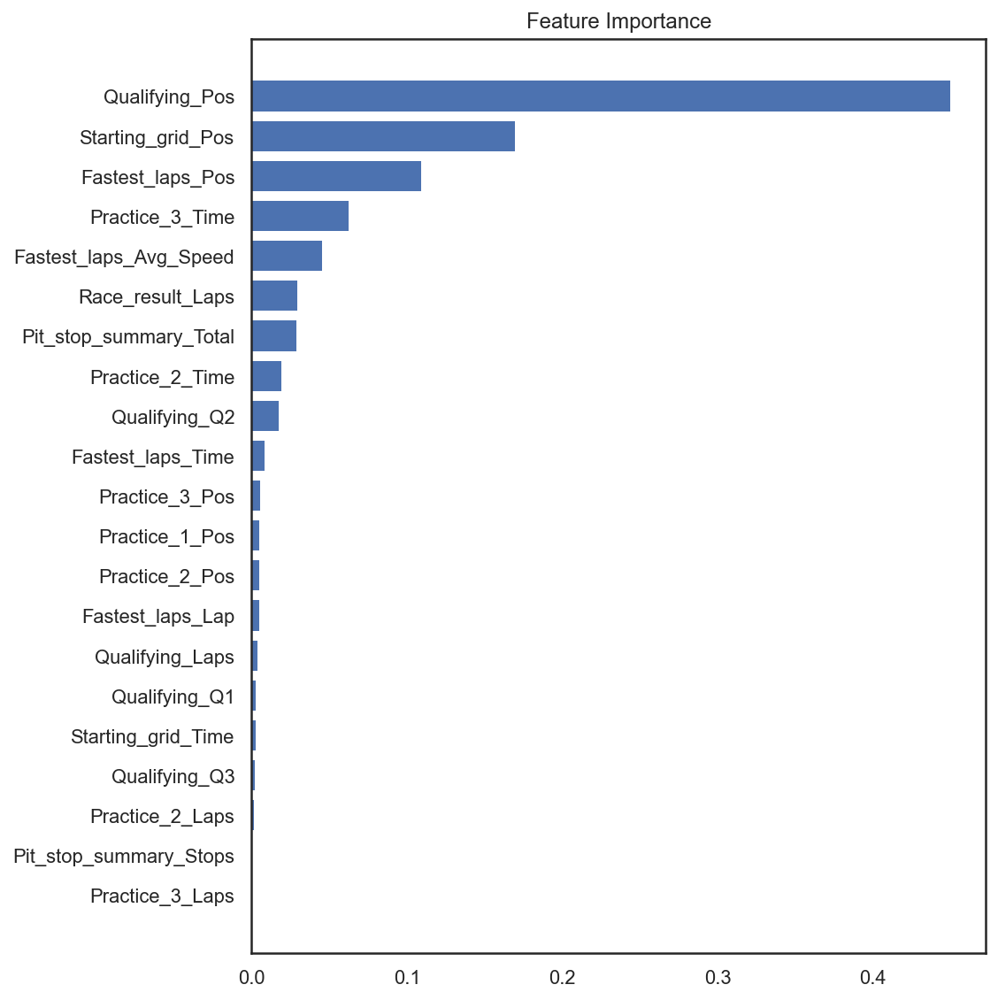

In [908]:
# DETERMINING THE MOST EFFECTIVE FEATURES
import numpy as np
import matplotlib.pyplot as plt
from sklearn.inspection import permutation_importance

feature_importance = gbm.feature_importances_[:21]
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5
fig = plt.figure(figsize=(8, 8))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, np.array(Xfiltered3.columns)[sorted_idx])
plt.title('Feature Importance')
result = permutation_importance(gbm, X3_test, y3_test, n_repeats=10,
                                random_state=42, n_jobs=2)
#sorted_idx = result.importances_mean.argsort()
fig.tight_layout()
plt.show()

In [909]:
# ALL FEATURES WITH ACOPMPINING COEFFIENCENT
list(zip(Xfiltered3.columns, gbm.feature_importances_))

[('Race_result_Laps', 0.03011076362786395),
 ('Fastest_laps_Pos', 0.10960344213934702),
 ('Fastest_laps_Lap', 0.005355793394738193),
 ('Fastest_laps_Time', 0.008770755853503938),
 ('Fastest_laps_Avg_Speed', 0.04599891612084718),
 ('Pit_stop_summary_Stops', 0.0008521357354088595),
 ('Pit_stop_summary_Total', 0.029620057693687533),
 ('Starting_grid_Pos', 0.16997240047516865),
 ('Starting_grid_Time', 0.0029104377564592196),
 ('Qualifying_Pos', 0.45004233726683096),
 ('Qualifying_Q1', 0.003076564482447743),
 ('Qualifying_Q2', 0.018134661361825608),
 ('Qualifying_Q3', 0.002895887278632611),
 ('Qualifying_Laps', 0.00457582918119065),
 ('Practice_3_Pos', 0.005760601897694939),
 ('Practice_3_Time', 0.06281328845892244),
 ('Practice_3_Laps', 0.0002629410531670467),
 ('Practice_2_Pos', 0.0054047059607021134),
 ('Practice_2_Time', 0.01985609632182308),
 ('Practice_2_Laps', 0.0021297196959481936),
 ('Practice_1_Pos', 0.0057002382786368435),
 ('Practice_1_Time', 0.011540704321743889),
 ('Practice_1

In [965]:
# PREDICTING X TESTING VALUES
y_hat = gbm.predict(X3_test)

## Plotting the Relationship between the Predicited Values and the True Value

Text(0.5, 1.0, 'Normal Q-Q plot')

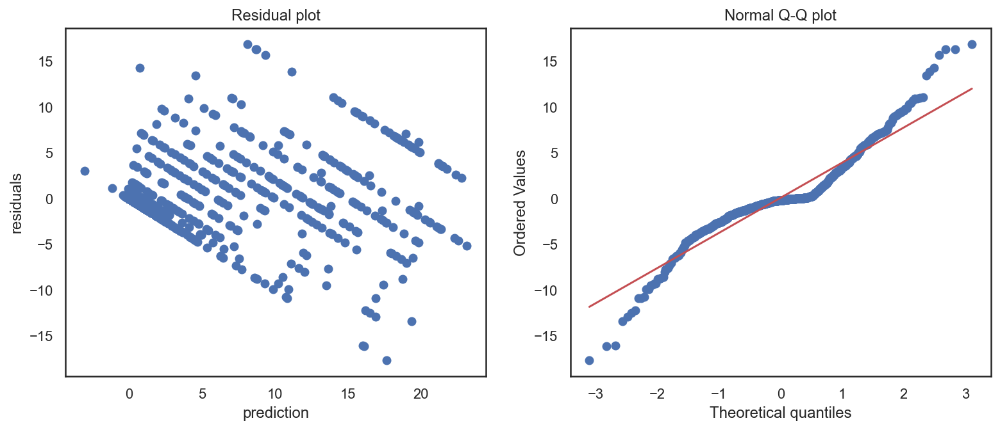

In [986]:
plt.figure(figsize=(20,5))
    
#plt.subplot(1, 3, 1)
#plt.scatter(y_hat,y3_test)
#plt.title("Regression fit")
#plt.xlabel("y hat")
#plt.ylabel("y")
    
plt.subplot(1, 3, 2)
res = y3_test - y_hat
plt.scatter(y_hat, res)
plt.title("Residual plot")
plt.xlabel("prediction")
plt.ylabel("residuals")
    
plt.subplot(1, 3, 3)
#Generates a probability plot of sample data against the quantiles of a 
# specified theoretical distribution 
stats.probplot(res, dist="norm", plot=plt)
plt.title("Normal Q-Q plot")

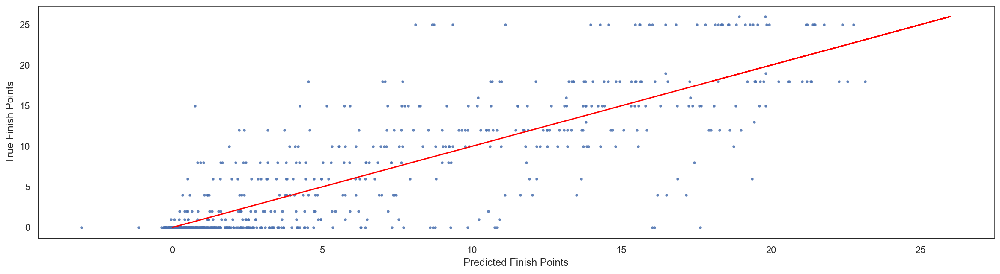

In [907]:
plt.figure(figsize=(20,5))
g1 = sns.regplot(x=y_hat, y=y3_test, ci=False, fit_reg=False, line_kws={'color': 'blue'}, scatter_kws={'s': 5})
g1.set_xlabel('Predicted Finish Points')
g1.set_ylabel('True Finish Points')
g1.plot(y3_test, y3_test, color='red')

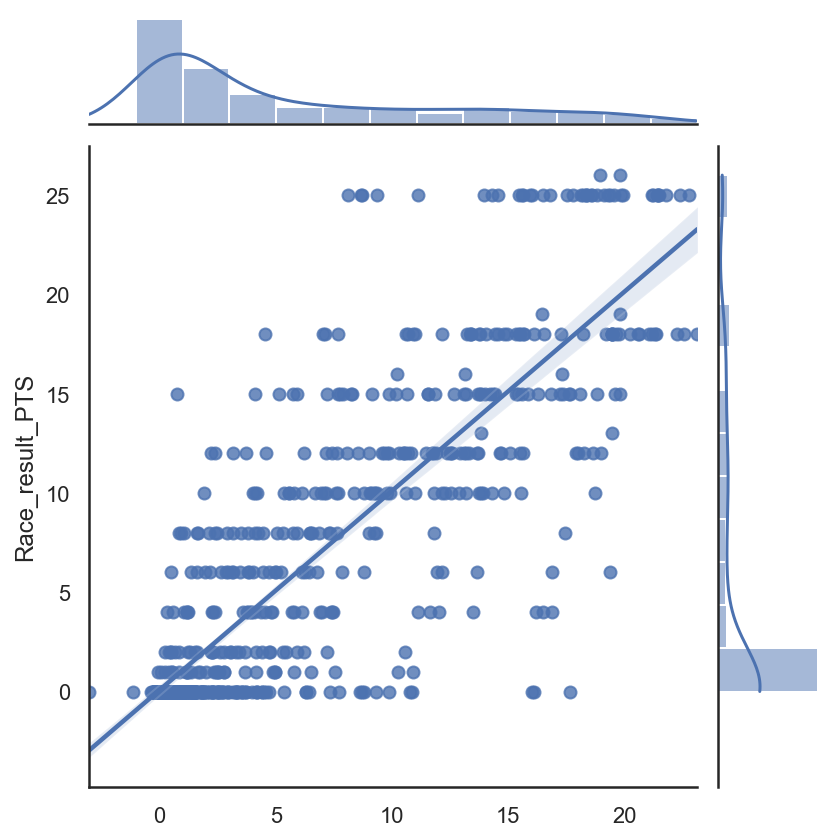

In [971]:
sns.jointplot(y_hat, y3_test, kind='reg')